<center>
  <h1 style="background-color:white; color:purple; font-size:40px; font-weight:bold; font-family:Times New Roman; border:2px solid black;"> Data Science internship by CodSoft </h1>
</center>

# task_1 as Titanic Survival Prediction

# <font color="purple"><b>Import Library</b></font>

In [612]:
import numpy as np 
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px
import missingno

%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, recall_score, f1_score, precision_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import Perceptron
from sklearn.gaussian_process import GaussianProcessClassifier
import category_encoders as ce


import warnings
warnings.filterwarnings('ignore')

# <font color="purple"><b>Read Dataset</b></font>

In [613]:
tsp = pd.read_csv('tested.csv')

In [93]:
tsp

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,0,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,1,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,0,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,0,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,1,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
413,1305,0,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,0,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,0,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S


In [4]:
tsp.head(10)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,0,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,1,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,0,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,0,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,1,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S
5,897,0,3,"Svensson, Mr. Johan Cervin",male,14.0,0,0,7538,9.2250,NaN,S
6,898,1,3,"Connolly, Miss. Kate",female,30.0,0,0,330972,7.6292,NaN,Q
7,899,0,2,"Caldwell, Mr. Albert Francis",male,26.0,1,1,248738,29.0000,NaN,S
8,900,1,3,"Abrahim, Mrs. Joseph (Sophie Halaut Easu)",female,18.0,0,0,2657,7.2292,NaN,C
9,901,0,3,"Davies, Mr. John Samuel",male,21.0,2,0,A/4 48871,24.1500,NaN,S


In [5]:
tsp.tail()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
413,1305,0,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,0,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,0,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S
417,1309,0,3,"Peter, Master. Michael J",male,NaN,1,1,2668,22.3583,NaN,C


# <font color="purple"><b>Data exploration</b></font>

In [6]:
tsp.dtypes  # Name, sex, ticket, cabin, embarked 

PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex             object
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked        object
dtype: object

In [7]:
tsp.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,418.000000,418.000000,418.000000,332.000000,418.000000,418.000000,417.000000
mean,1100.500000,0.363636,2.265550,30.272590,0.447368,0.392344,35.627188
std,120.810458,0.481622,0.841838,14.181209,0.896760,0.981429,55.907576
min,892.000000,0.000000,1.000000,0.170000,0.000000,0.000000,0.000000
25%,996.250000,0.000000,1.000000,21.000000,0.000000,0.000000,7.895800
50%,1100.500000,0.000000,3.000000,27.000000,0.000000,0.000000,14.454200
75%,1204.750000,1.000000,3.000000,39.000000,1.000000,0.000000,31.500000
max,1309.000000,1.000000,3.000000,76.000000,8.000000,9.000000,512.329200


In [8]:
all_data_info = tsp.describe(include='all')
all_data_info

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
count,418.000000,418.000000,418.000000,418,418,332.000000,418.000000,418.000000,418,417.000000,91,418
unique,NaN,NaN,NaN,418,2,NaN,NaN,NaN,363,NaN,76,3
top,NaN,NaN,NaN,"Kelly, Mr. James",male,NaN,NaN,NaN,PC 17608,NaN,B57 B59 B63 B66,S
freq,NaN,NaN,NaN,1,266,NaN,NaN,NaN,5,NaN,3,270
mean,1100.500000,0.363636,2.265550,NaN,NaN,30.272590,0.447368,0.392344,NaN,35.627188,NaN,NaN
std,120.810458,0.481622,0.841838,NaN,NaN,14.181209,0.896760,0.981429,NaN,55.907576,NaN,NaN
min,892.000000,0.000000,1.000000,NaN,NaN,0.170000,0.000000,0.000000,NaN,0.000000,NaN,NaN
25%,996.250000,0.000000,1.000000,NaN,NaN,21.000000,0.000000,0.000000,NaN,7.895800,NaN,NaN
50%,1100.500000,0.000000,3.000000,NaN,NaN,27.000000,0.000000,0.000000,NaN,14.454200,NaN,NaN
75%,1204.750000,1.000000,3.000000,NaN,NaN,39.000000,1.000000,0.000000,NaN,31.500000,NaN,NaN


In [9]:
print("Titanic Data Size  :" ,tsp.size)

Titanic Data Size  : 5016


In [10]:
print("Titanic Data Shape :" ,tsp.shape)

Titanic Data Shape : (418, 12)


In [11]:
tsp.count()

PassengerId    418
Survived       418
Pclass         418
Name           418
Sex            418
Age            332
SibSp          418
Parch          418
Ticket         418
Fare           417
Cabin           91
Embarked       418
dtype: int64

In [12]:
tsp.groupby(['Embarked']).count()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin
Embarked,,,,,,,,,,,
C,102,102,102,102,102,82,102,102,102,102,49
Q,46,46,46,46,46,22,46,46,46,46,1
S,270,270,270,270,270,228,270,270,270,269,41


In [13]:
tsp['Cabin'].unique()

array([nan, 'B45', 'E31', 'B57 B59 B63 B66', 'B36', 'A21', 'C78', 'D34',
       'D19', 'A9', 'D15', 'C31', 'C23 C25 C27', 'F G63', 'B61', 'C53',
       'D43', 'C130', 'C132', 'C101', 'C55 C57', 'B71', 'C46', 'C116',
       'F', 'A29', 'G6', 'C6', 'C28', 'C51', 'E46', 'C54', 'C97', 'D22',
       'B10', 'F4', 'E45', 'E52', 'D30', 'B58 B60', 'E34', 'C62 C64',
       'A11', 'B11', 'C80', 'F33', 'C85', 'D37', 'C86', 'D21', 'C89',
       'F E46', 'A34', 'D', 'B26', 'C22 C26', 'B69', 'C32', 'B78',
       'F E57', 'F2', 'A18', 'C106', 'B51 B53 B55', 'D10 D12', 'E60',
       'E50', 'E39 E41', 'B52 B54 B56', 'C39', 'B24', 'D28', 'B41', 'C7',
       'D40', 'D38', 'C105'], dtype=object)

In [14]:
tsp['Cabin'].nunique()

76

In [15]:
tsp.groupby(['Sex']).count()

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
Sex,,,,,,,,,,,
female,152,152,152,152,127,152,152,152,152,44,152
male,266,266,266,266,205,266,266,266,265,47,266


In [16]:
tsp.groupby(['Survived']).count()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
Survived,,,,,,,,,,,
0,266,266,266,266,205,266,266,266,265,47,266
1,152,152,152,152,127,152,152,152,152,44,152


In [17]:
tsp.groupby(['Pclass']).count()

,PassengerId,Survived,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
Pclass,,,,,,,,,,,
1,107,107,107,107,98,107,107,107,107,80,107
2,93,93,93,93,88,93,93,93,93,7,93
3,218,218,218,218,146,218,218,218,217,4,218


In [18]:
tsp.groupby(['SibSp']).count()

,PassengerId,Survived,Pclass,Name,Sex,Age,Parch,Ticket,Fare,Cabin,Embarked
SibSp,,,,,,,,,,,
0,283,283,283,283,283,214,283,283,282,45,283
1,110,110,110,110,110,97,110,110,110,41,110
2,14,14,14,14,14,11,14,14,14,4,14
3,4,4,4,4,4,4,4,4,4,1,4
4,4,4,4,4,4,4,4,4,4,0,4
5,1,1,1,1,1,1,1,1,1,0,1
8,2,2,2,2,2,1,2,2,2,0,2


In [19]:
tsp.Parch.value_counts()

Parch
0    324
1     52
2     33
3      3
4      2
9      2
6      1
5      1
Name: count, dtype: int64

In [20]:
tsp[tsp.Survived ==0].Pclass.describe()

count    266.000000
mean       2.334586
std        0.808497
min        1.000000
25%        2.000000
50%        3.000000
75%        3.000000
max        3.000000
Name: Pclass, dtype: float64

In [21]:
tsp[tsp.Survived ==1].Pclass.describe()

count    152.000000
mean       2.144737
std        0.887051
min        1.000000
25%        1.000000
50%        2.000000
75%        3.000000
max        3.000000
Name: Pclass, dtype: float64

# <font color="purple"><b>Data Visualization</b></font>

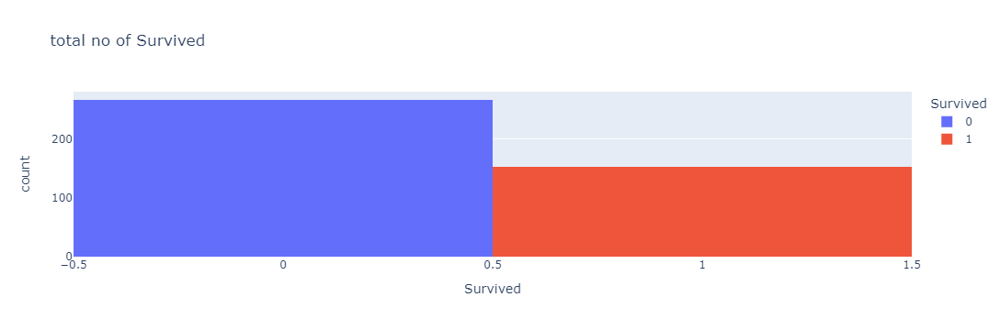

In [22]:
fig = px.histogram(data_frame=tsp, x='Survived', title='total no of Survived', color='Survived')
fig.show()

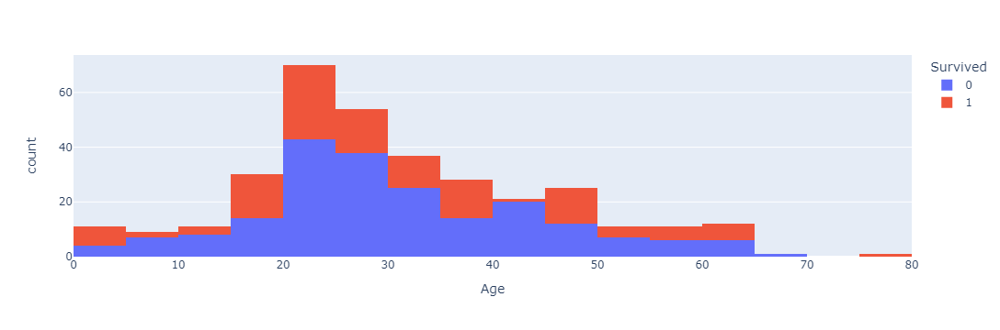

<Figure size 1500x1500 with 0 Axes>

In [23]:
plt.figure(figsize = (15, 15))
fig1 = px.histogram(tsp, x="Age", color="Survived")  
fig1.show()  

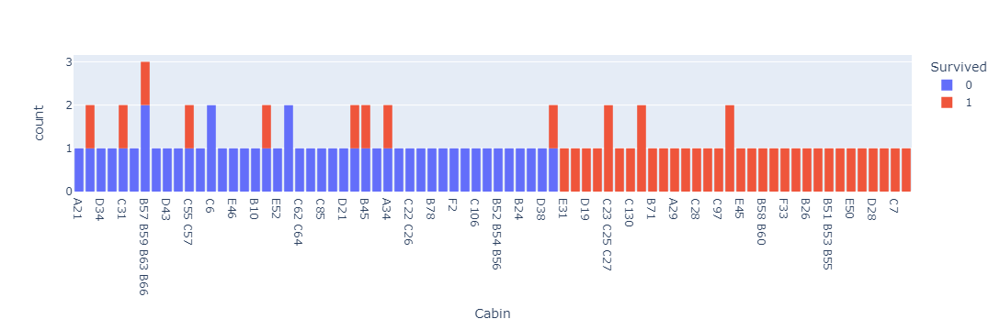

In [24]:
fig2 = px.histogram(tsp, x="Cabin", color="Survived")
fig2.show()  

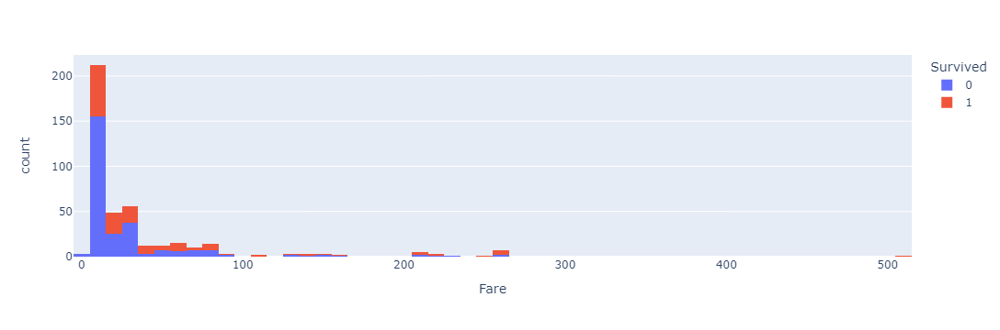

In [25]:
fig3 = px.histogram(tsp, x="Fare", color="Survived")
fig3.show()  

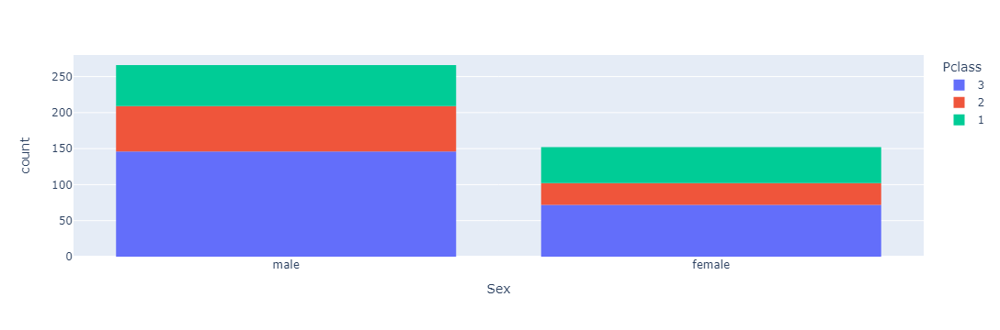

In [26]:
fig4 = px.histogram(tsp, x="Sex", color="Pclass")
fig4.show()  

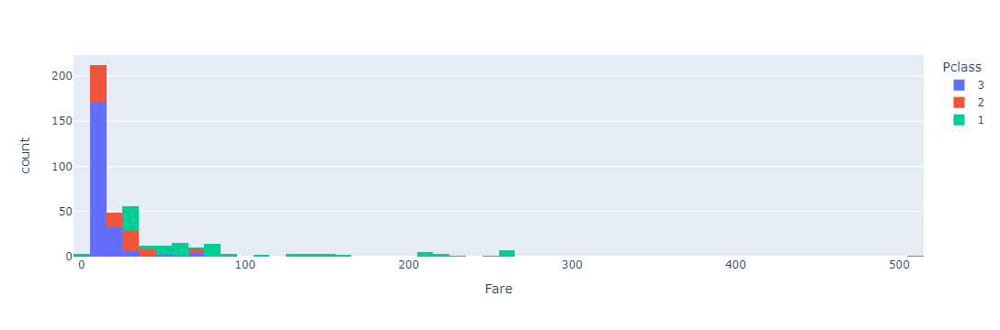

In [27]:
fig5 = px.histogram(tsp, x="Fare", color="Pclass")
fig5.show()  

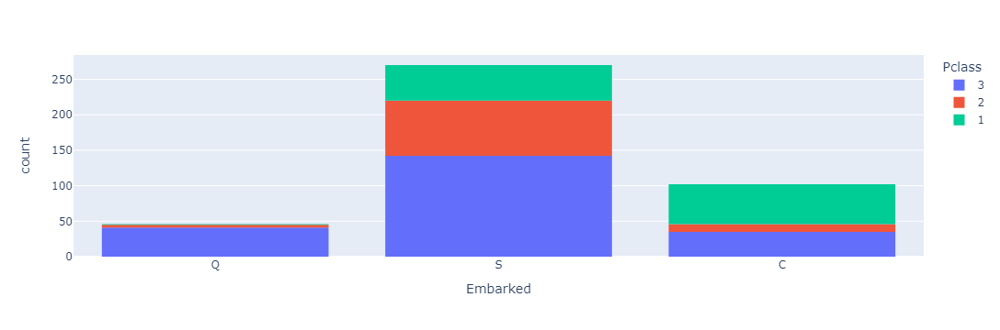

In [28]:
fig6 = px.histogram(tsp, x="Embarked", color="Pclass")
fig6.show()  

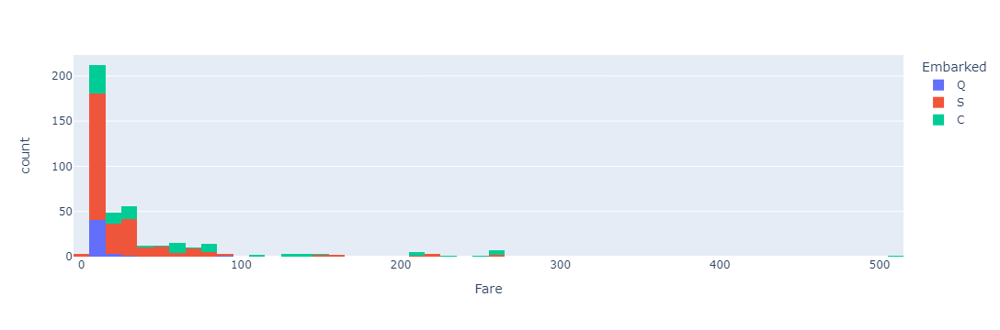

In [29]:
fig7 = px.histogram(tsp, x="Fare", color="Embarked")
fig7.show()  

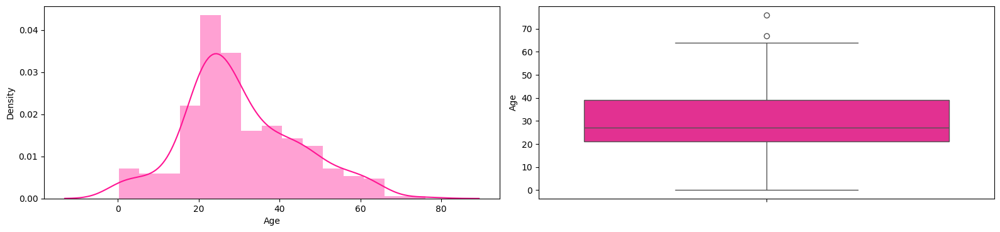

In [30]:
plt.figure(figsize=(16,7))

plt.subplot(2,2,1)
sns.distplot(tsp['Age'],color='DeepPink')

plt.subplot(2,2,2)
sns.boxplot(tsp['Age'],color='DeepPink')

plt.tight_layout()
plt.show()

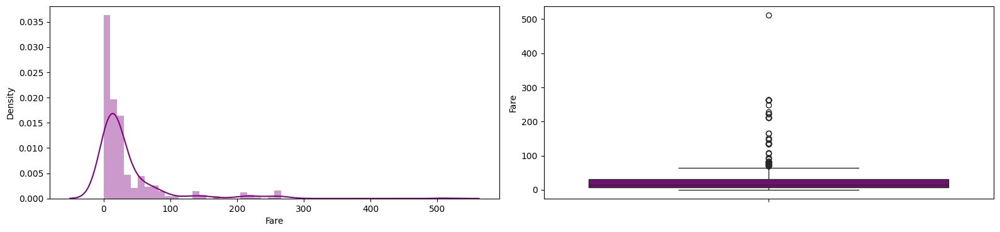

In [31]:
plt.figure(figsize=(16,7))

plt.subplot(2,2,3)
sns.distplot(tsp['Fare'],color='purple')

plt.subplot(2,2,4)
sns.boxplot(tsp['Fare'],color='purple')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Sex')

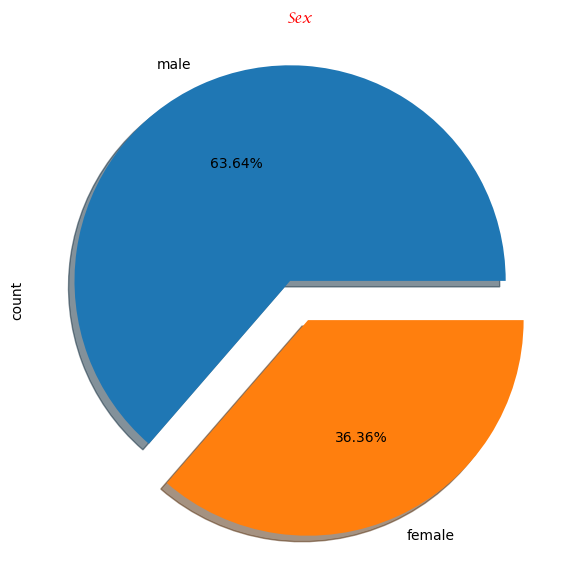

In [32]:
plt.figure(figsize=(16,7))
plt.title("Sex", fontsize=22)

ax =plt.subplot(1,2,2)
ax=tsp['Sex'].value_counts().plot.pie(explode=[0.1, 0.1], autopct='%1.2f%%', shadow=True)

ax.set_title(label = "Sex", fontsize = 22, color='Red', font='Lucida Calligraphy')

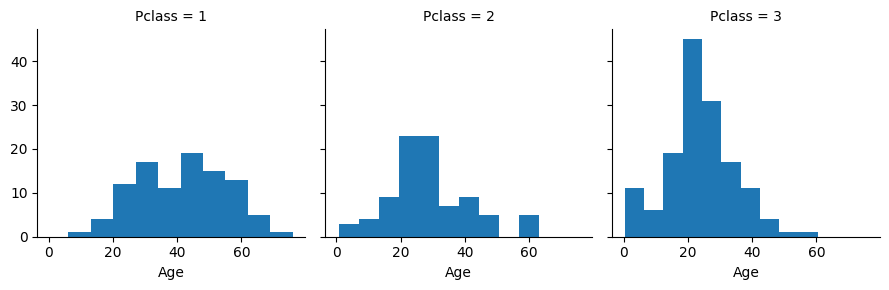

In [33]:
gg = sns.FacetGrid(tsp, col="Pclass")
gg = gg.map(plt.hist, "Age")

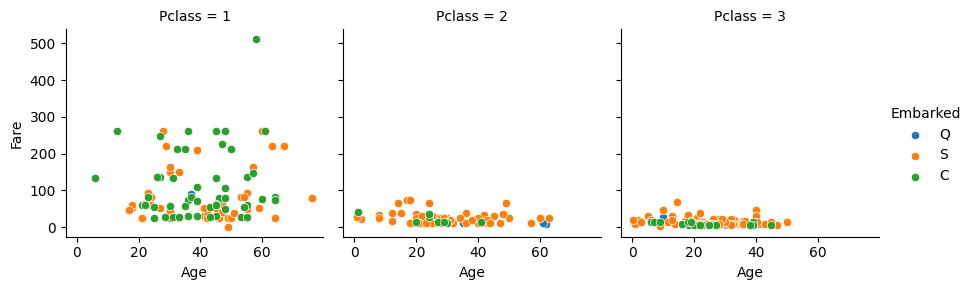

In [34]:
oo = sns.FacetGrid(tsp, col="Pclass", hue="Embarked")
oo.map_dataframe(sns.scatterplot, x="Age", y="Fare")

oo.add_legend()
plt.show()

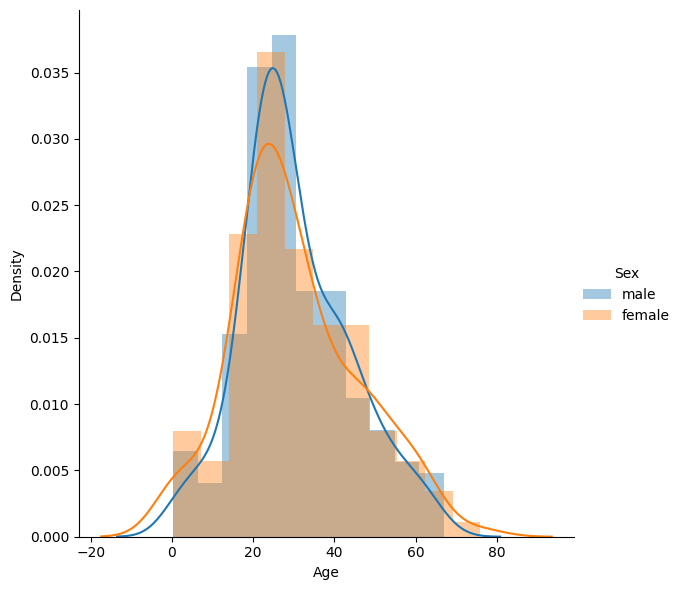

In [35]:
sns.FacetGrid(tsp, hue='Sex', height=6).map(sns.distplot, 'Age').add_legend()

plt.show()

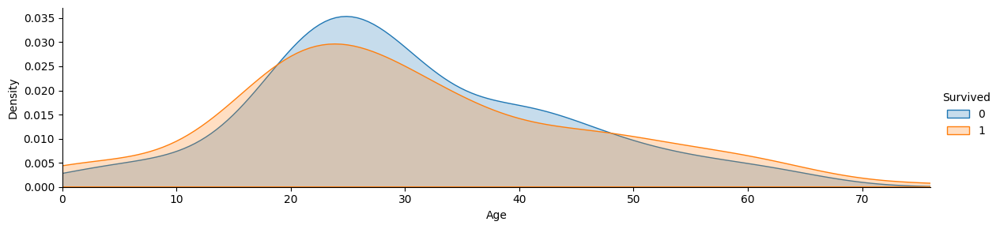

In [36]:
fig = sns.FacetGrid(tsp, hue="Survived", aspect=4)

fig.map(sns.kdeplot, 'Age', shade=True)

old = tsp['Age'].max()

fig.set(xlim=(0, old))

fig.add_legend()
plt.show()

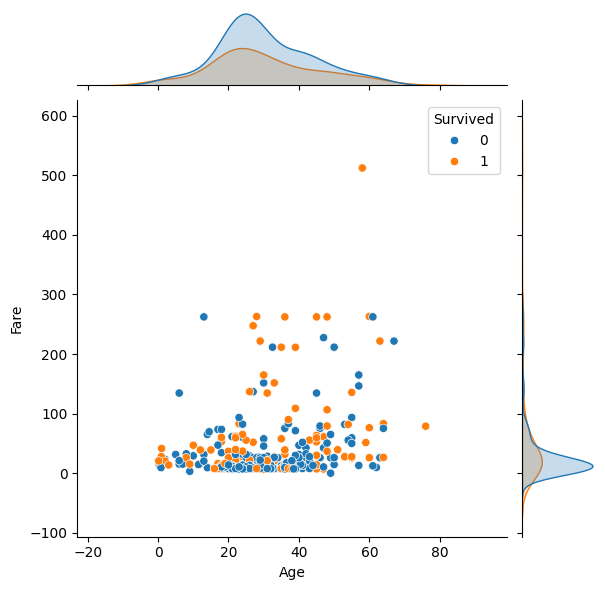

In [37]:
sns.jointplot(x="Age", y="Fare", data=tsp, color="olive", hue="Survived")

plt.show()

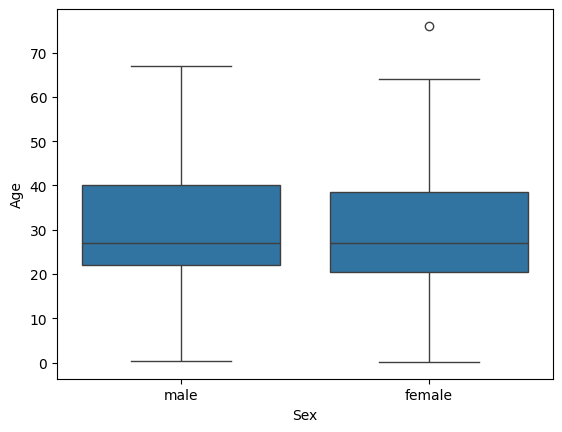

In [38]:
sns.boxplot(x='Sex', y='Age', data= tsp)

plt.show()

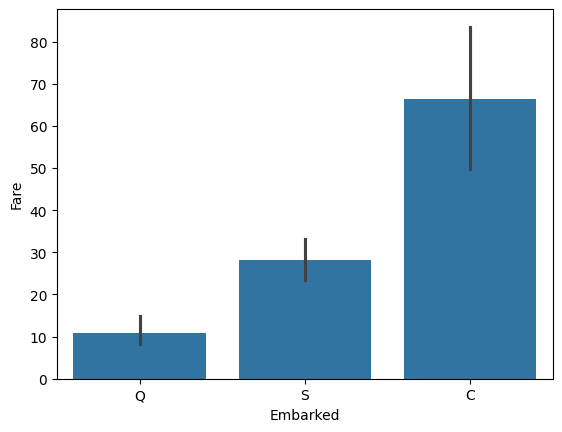

In [39]:
sns.barplot(y='Fare', x='Embarked', data=tsp)

plt.show()

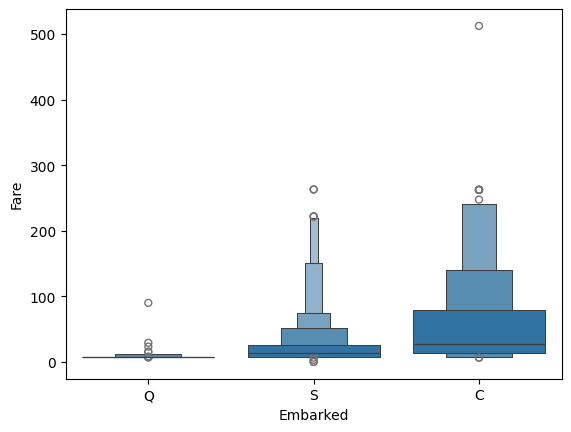

In [40]:
sns.boxenplot(y="Fare", x="Embarked", data=tsp)

plt.show()

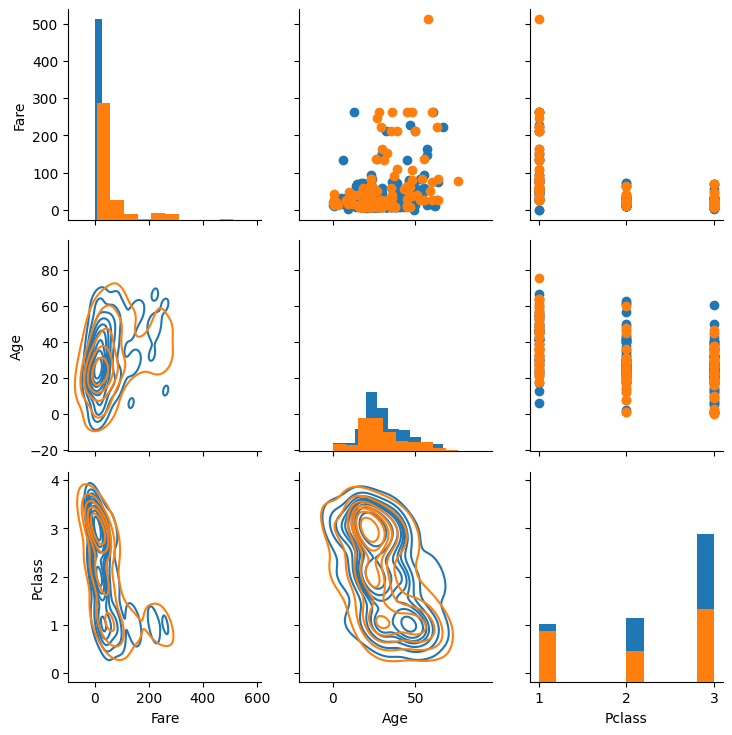

In [41]:
tsp_g = sns.PairGrid(tsp, hue='Sex', vars=['Fare','Age','Pclass'])

tsp_g.map_diag(plt.hist)
tsp_g.map_upper(plt.scatter)
tsp_g.map_lower(sns.kdeplot)

plt.show()

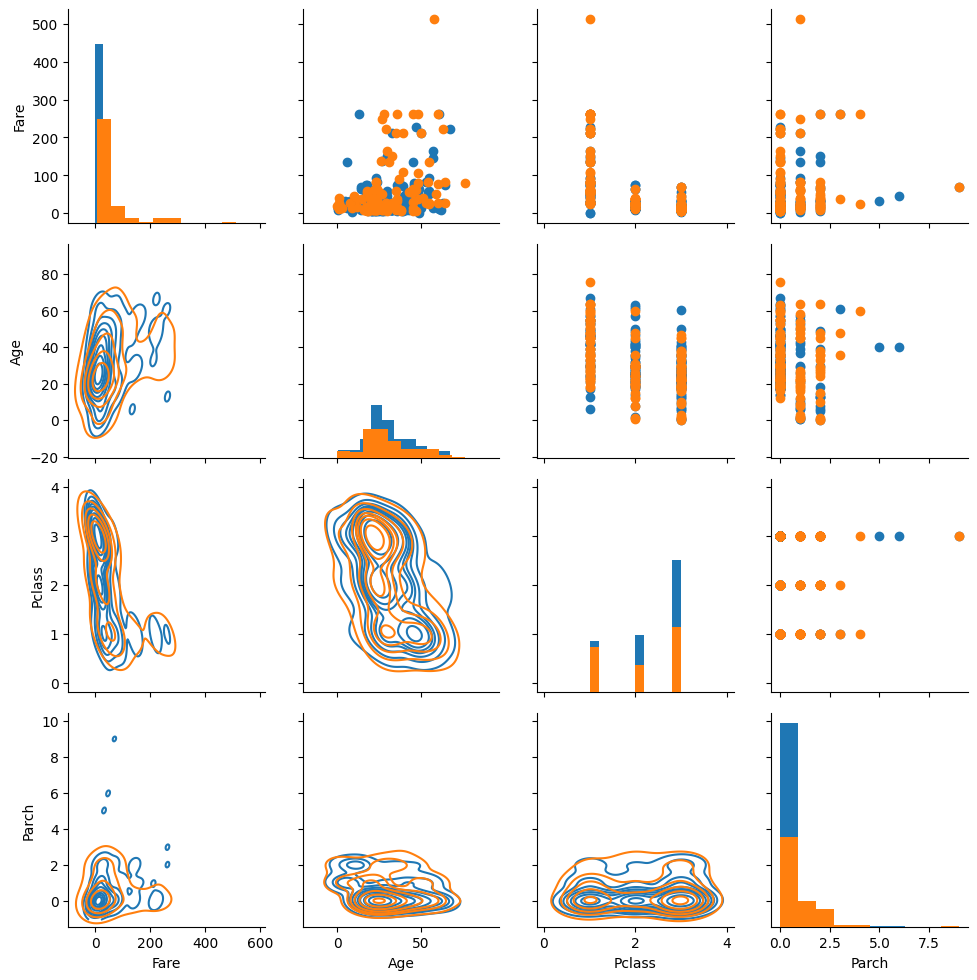

In [42]:
tsp_gg = sns.PairGrid(tsp, hue='Sex', vars=['Fare','Age','Pclass', 'Parch'])

tsp_gg.map_diag(plt.hist)
tsp_gg.map_upper(plt.scatter)
tsp_gg.map_lower(sns.kdeplot)

plt.show()

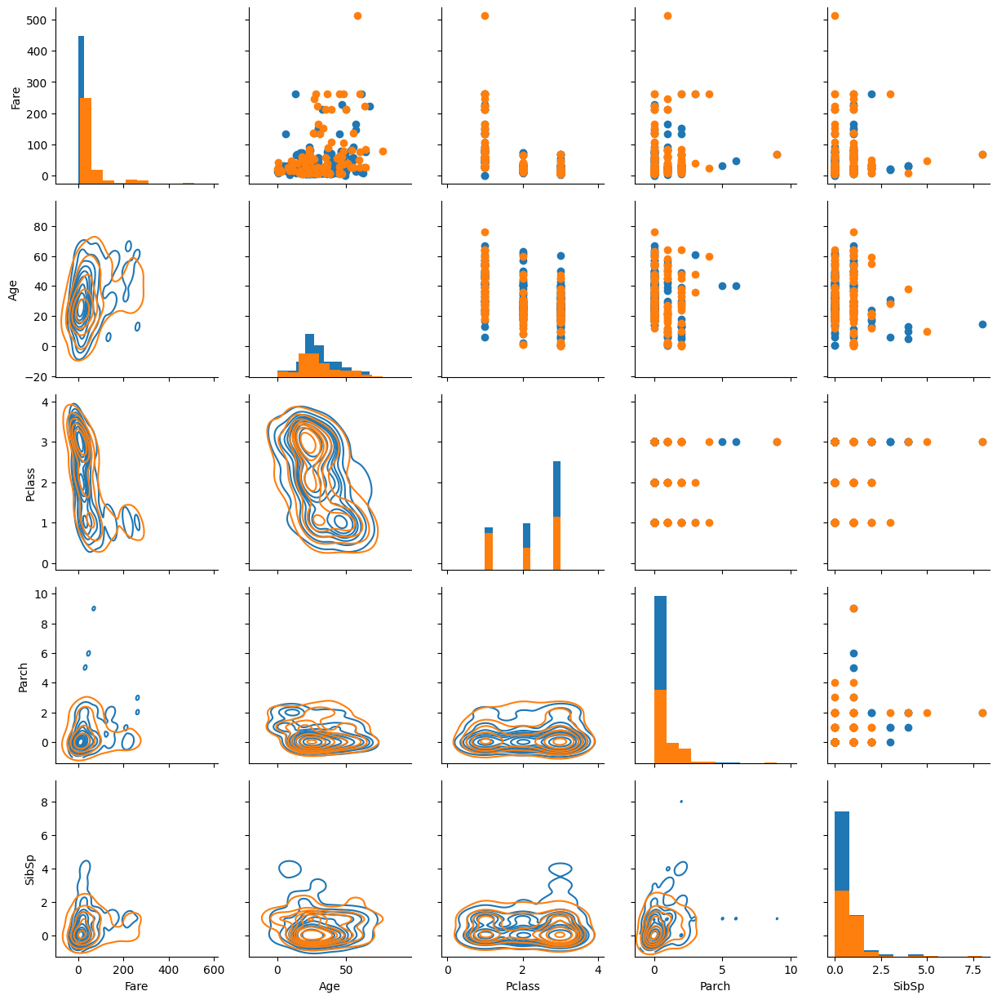

In [43]:
tsp_j = sns.PairGrid(tsp, hue='Sex', vars=['Fare','Age','Pclass', 'Parch','SibSp'])

tsp_j.map_diag(plt.hist)
tsp_j.map_upper(plt.scatter)
tsp_j.map_lower(sns.kdeplot)

plt.show()

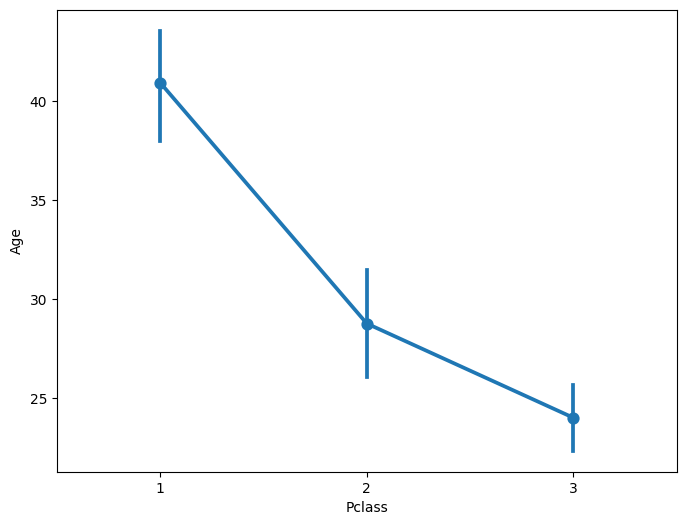

In [44]:
f, ax = plt.subplots(figsize=(8, 6))
sns.pointplot(x="Pclass", y="Age", data=tsp)

plt.show()

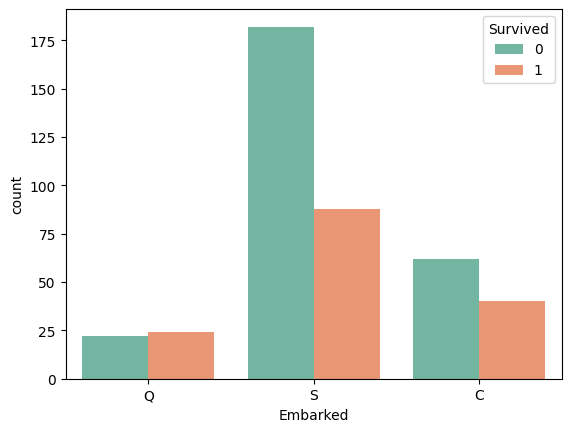

In [45]:
sns.countplot(x = 'Embarked', hue = 'Survived', palette = 'Set2', data = tsp)

plt.show()

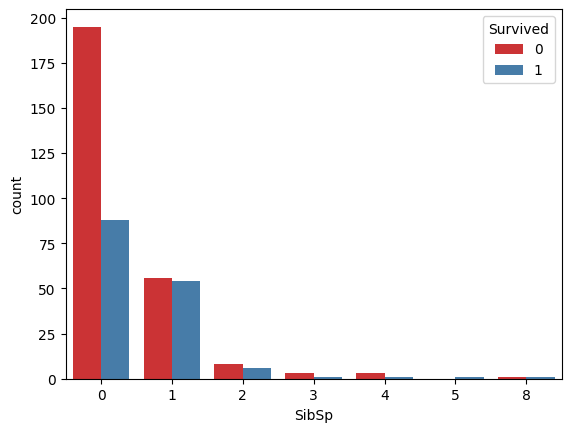

In [46]:
sns.countplot(x = 'SibSp', hue = 'Survived', palette = 'Set1', data = tsp)

plt.show()

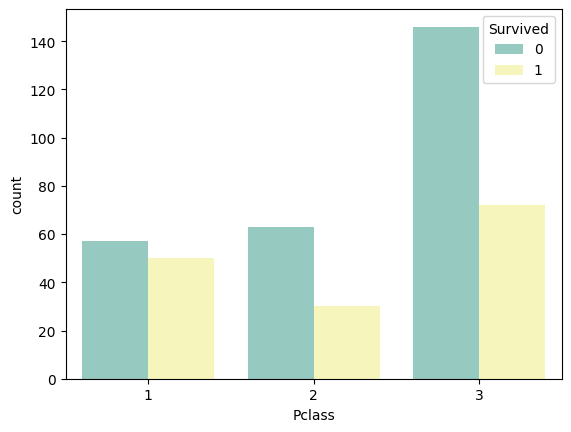

In [47]:
sns.countplot(x = 'Pclass', hue = 'Survived', palette = 'Set3', data = tsp)

plt.show()

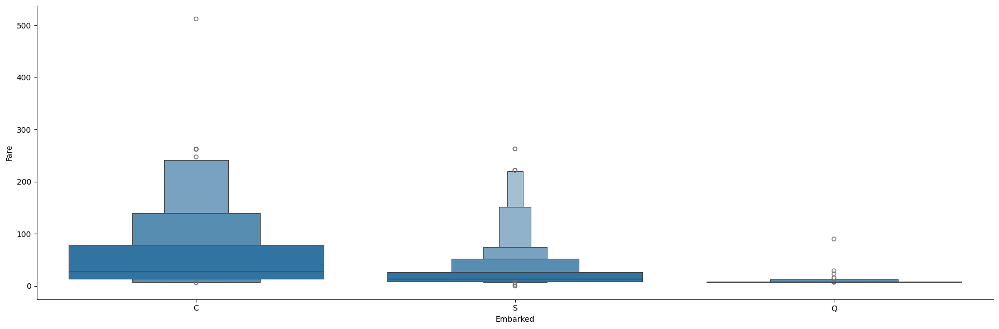

In [48]:
sns.catplot(y ="Fare", x ="Embarked", data =tsp.sort_values("Fare", ascending =False), kind="boxen", height =6, aspect =3)

plt.show()

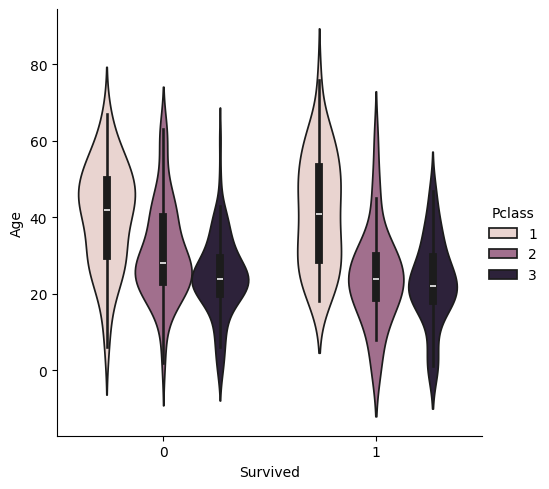

In [49]:
sns.catplot(data=tsp, x='Survived', y='Age', hue='Pclass', kind="violin")

plt.show()

In [50]:
def add_percentage_labels(plot, total_count):
    for patch in plot.patches:
        # Get the height and width of each bar in the plot
        height = patch.get_height()
        width = patch.get_width()

        # Calculate the percentage of the total count represented by this bar
        percentage = (height / total_count) * 100

        # Add the percentage label to the plot
        plot.annotate('{:.1f}%'.format(percentage), (patch.get_x() + width / 2, patch.get_y() + height * 1.02), ha="center")

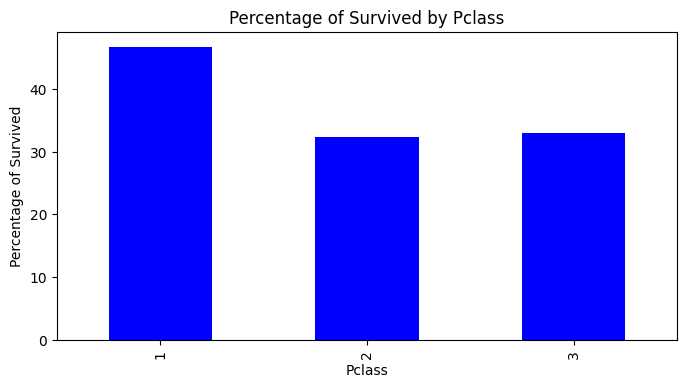

In [51]:
# Calculate the percentage of Survived by Pclass
fraud_pct = tsp.groupby("Pclass")["Survived"].mean() * 100

# Create a bar chart using Matplotlib
fig, ax = plt.subplots(figsize=(8, 4))
fraud_pct.plot(kind="bar", ax=ax, color="blue")

ax.set_xlabel("Pclass")
ax.set_ylabel("Percentage of Survived")
ax.set_title("Percentage of Survived by Pclass")

plt.show()

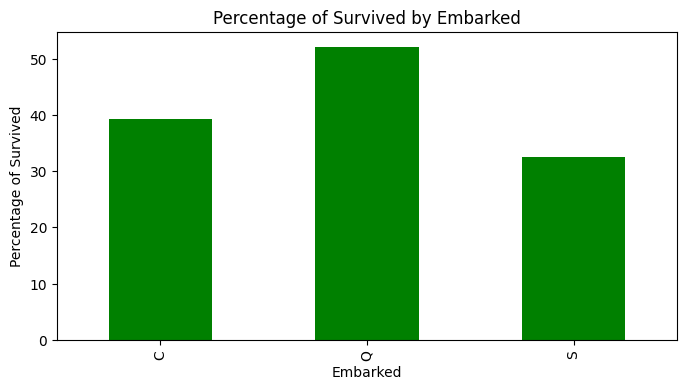

In [52]:
# Calculate the percentage of Survived by Embarked
fraud_pct = tsp.groupby("Embarked")["Survived"].mean() * 100

# Create a bar chart using Matplotlib
fig, ax = plt.subplots(figsize=(8, 4))
fraud_pct.plot(kind="bar", ax=ax, color="g")

ax.set_xlabel("Embarked")
ax.set_ylabel("Percentage of Survived")
ax.set_title("Percentage of Survived by Embarked")

plt.show()

<Axes: xlabel='Survived', ylabel='Pclass-Embarked'>

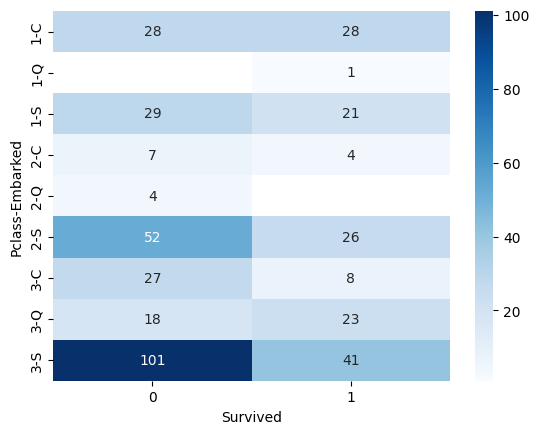

In [53]:
pivot = pd.pivot_table(tsp, index=["Pclass", "Embarked"], columns=["Survived"], aggfunc="size")
sns.heatmap(pivot, cmap="Blues", annot=True, fmt=".0f")

In [54]:
# Identify non-numeric columns
non_numeric_columns = tsp.select_dtypes(exclude=['number']).columns

# # Drop non-numeric columns (if they are not needed)
tsp = tsp.drop(columns=non_numeric_columns)

<Axes: >

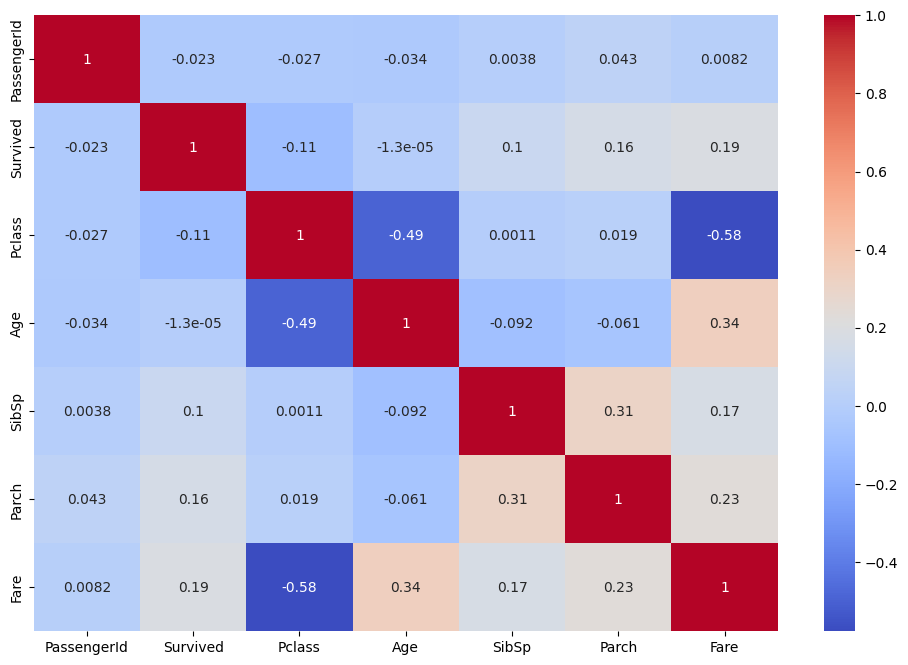

In [55]:
plt.figure(figsize=(12,8))

sns.heatmap(tsp.corr(),cmap='coolwarm',annot=True)

Index(['Pclass', 'Age', 'Fare'], dtype='object')


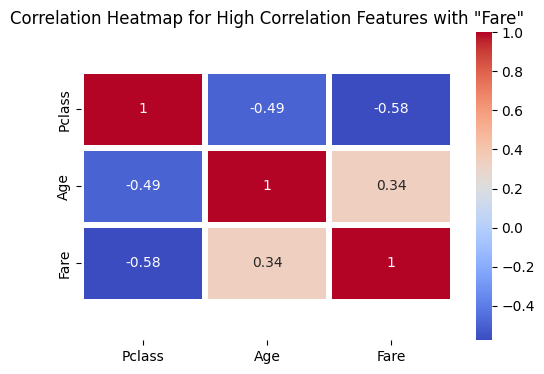

In [56]:
hig_corr = tsp.corr()
hig_corr_features = hig_corr.index[abs(hig_corr["Fare"]) >= 0.25]

print(hig_corr_features)

# Create a heatmap for the high correlation features
plt.figure(figsize=(6, 4))
ax = sns.heatmap(tsp[hig_corr_features].corr(), cmap="coolwarm", annot=True, linewidth=3)

# Fix the issue with the first and last row being cut in half
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

plt.title('Correlation Heatmap for High Correlation Features with "Fare"')
plt.show()

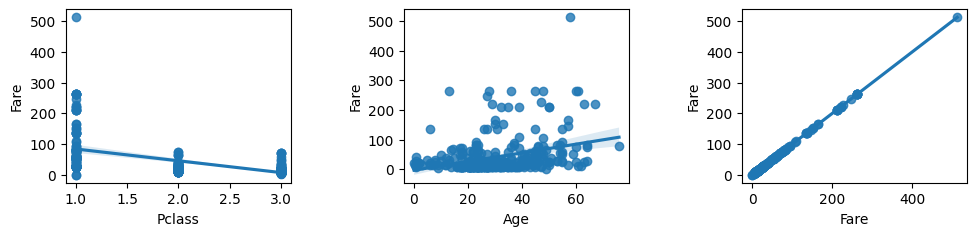

In [57]:
plt.figure(figsize=(16,9))

for i in range(len(hig_corr_features)):
    if i <= 9:
        plt.subplot(3,4,i+1)
        plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
        sns.regplot(data=tsp, x = hig_corr_features[i], y = 'Fare')
        
plt.show() 

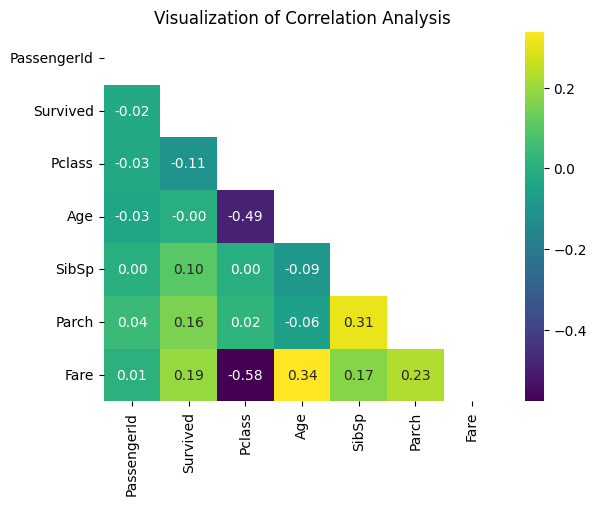

In [58]:
# Exclude non-numeric columns from the DataFrame
numeric_columns = tsp.select_dtypes(include=[np.number])

# Calculate the correlation matrix
corr = numeric_columns.corr()

# Create a mask to hide the upper triangle of the correlation matrix
mask = np.triu(np.ones_like(corr, dtype=bool))

# Create the heatmap
plt.figure(dpi=100)
plt.title('Visualization of Correlation Analysis')
sns.heatmap(corr, mask=mask, annot=True, lw=0, linecolor='white', cmap='viridis', fmt="0.2f")

plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

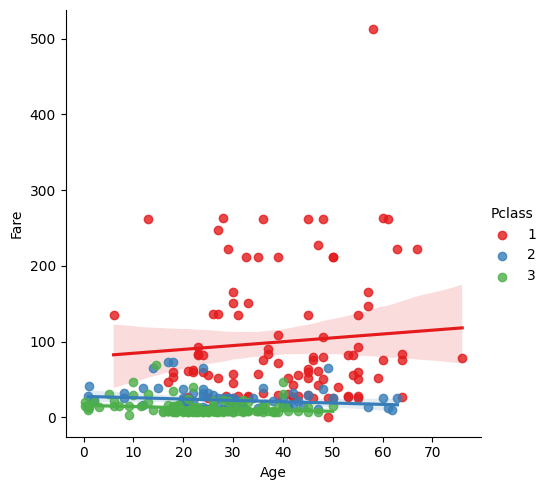

In [59]:
g= sns.lmplot(x="Age", y="Fare", hue="Pclass", data=tsp, palette="Set1")

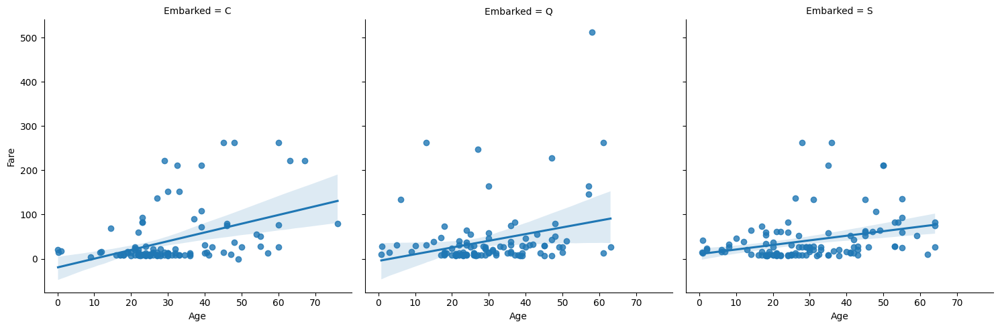

In [60]:
# Assuming 'tsp' is your DataFrame
tsp['Embarked']=['C', 'Q', 'S'] * (len(tsp) // 3) + ['C', 'Q', 'S'][:len(tsp) % 3]

# Now you can use 'Embarked' as the 'col' parameter in lmplot
sns.lmplot(x="Age", y="Fare", col="Embarked", data=tsp)
plt.show()

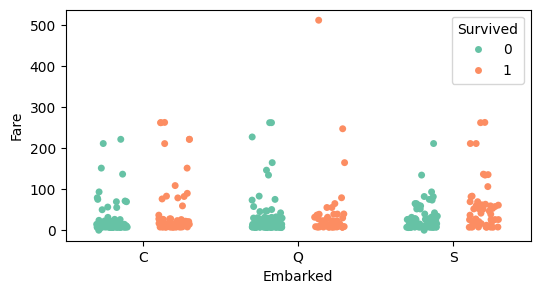

In [61]:
f, ax = plt.subplots(figsize=(6, 3))

sns.stripplot(x="Embarked", y="Fare", hue="Survived",data=tsp, jitter=0.2, palette="Set2", dodge=True)

plt.show()

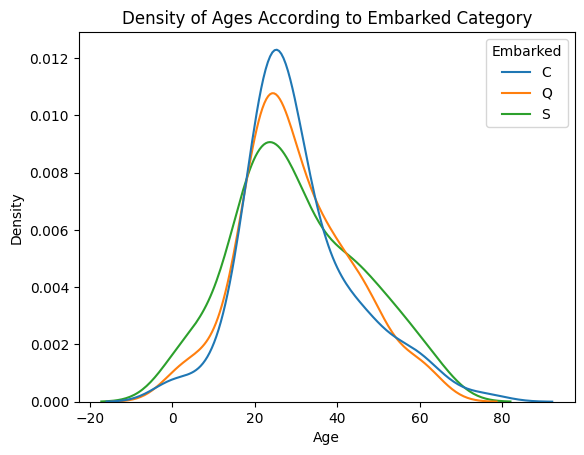

In [62]:
# Assuming 'tsp' is your DataFrame
sns.kdeplot(data=tsp, x="Age", hue="Embarked")  # Using 'Embarked' as an example

plt.title("Density of Ages According to Embarked Category")
plt.show()

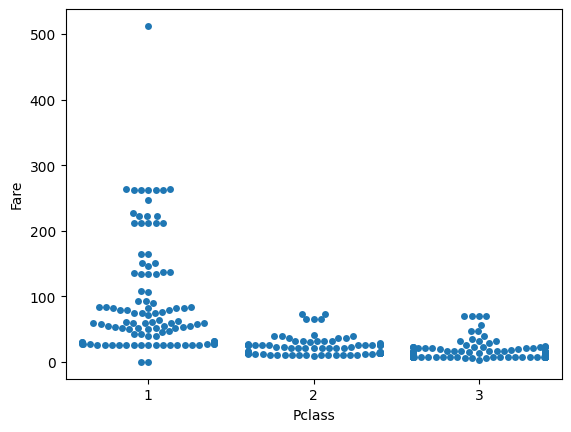

In [63]:
sns.swarmplot(x="Pclass", y="Fare", data=tsp)

plt.show()

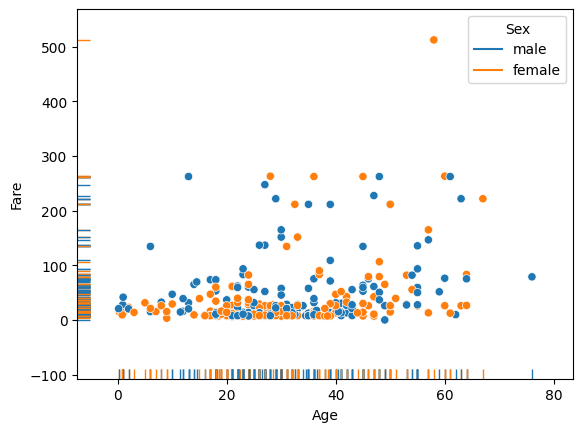

In [64]:
tsp['Sex'] = ['male', 'female'] * (len(tsp) // 2) + ['male', 'female'][:len(tsp) % 2]

sns.scatterplot(data=tsp, x="Age", y="Fare", hue="Sex")
sns.rugplot(data=tsp, x="Age", y="Fare", hue="Sex")
plt.show()


# <font color="purple"><b>Data preprocessing</b></font>

In [614]:
tsp.isnull().sum().sort_values(ascending = False) #Age, fare, cabin

Cabin          327
Age             86
Fare             1
PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
SibSp            0
Parch            0
Ticket           0
Embarked         0
dtype: int64

In [615]:
def missing (h):
    missing_number = h.isnull().sum().sort_values(ascending=False)
    missing_percent = (h.isnull().sum()/h.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values
missing(tsp)

,Missing_Number,Missing_Percent
Cabin,327,0.782297
Age,86,0.205742
Fare,1,0.002392
PassengerId,0,0.000000
Survived,0,0.000000
Pclass,0,0.000000
Name,0,0.000000
Sex,0,0.000000
SibSp,0,0.000000
Parch,0,0.000000


In [618]:
# Assuming tsp is your DataFrame
missing_values = tsp.isnull().sum()
total_values = tsp.shape[0]

# Calculate the percentage of missing values for each column
missing_percentage = (missing_values / total_values) * 100

# Sort columns by the percentage of missing values in ascending order
sorted_columns = missing_percentage.sort_values(ascending=True)

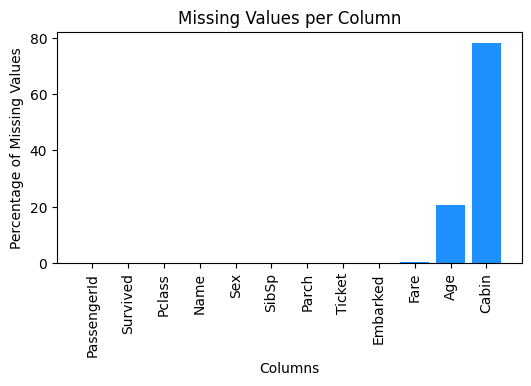

In [619]:
# Create a bar chart
fig, ax = plt.subplots(figsize=(6, 3))
ax.bar(sorted_columns.index, sorted_columns.values, color="dodgerblue")
ax.set_ylabel("Percentage of Missing Values")
ax.set_xlabel("Columns")
ax.set_title("Missing Values per Column")

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [6]:
tsp['Fare'] = tsp['Fare'].fillna(tsp['Fare'].mean()) #Removing the null value

In [7]:
tsp['Age'] = tsp['Age'].fillna(tsp['Age'].mean()) #Removing the null value

In [8]:
Embarked = tsp['Embarked'].unique()
for Embarkeds in Embarked:
    print("->",Embarkeds)

-> Q
-> S
-> C


In [9]:
tsp['Embarked'] = tsp['Embarked'].map( {'Q': 1,'S':2, 'C':3} ).astype(int)

In [10]:
tsp['Sex'] = tsp['Sex'].map( {'female': 0, 'male':1} ).astype(int)

In [11]:
tsp.dtypes

PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex              int32
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked         int32
dtype: object

In [12]:
tsp.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age              0
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          327
Embarked         0
dtype: int64

# <font color="purple"><b>Feature Engineering</b></font>

In [13]:
tsp.head() #ticket, Name, Cabin

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,0,3,"Kelly, Mr. James",1,34.5,0,0,330911,7.8292,NaN,1
1,893,1,3,"Wilkes, Mrs. James (Ellen Needs)",0,47.0,1,0,363272,7.0000,NaN,2
2,894,0,2,"Myles, Mr. Thomas Francis",1,62.0,0,0,240276,9.6875,NaN,1
3,895,0,3,"Wirz, Mr. Albert",1,27.0,0,0,315154,8.6625,NaN,2
4,896,1,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",0,22.0,1,1,3101298,12.2875,NaN,2


In [203]:
tsp = tsp.drop(['Name','Ticket','Cabin'],axis=1)

In [204]:
tsp = tsp.drop(['PassengerId'], axis=1)

In [205]:
tsp.head()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,3,1,34.5,0,0,7.8292,1
1,1,3,0,47.0,1,0,7.0000,2
2,0,2,1,62.0,0,0,9.6875,1
3,0,3,1,27.0,0,0,8.6625,2
4,1,3,0,22.0,1,1,12.2875,2


<Axes: >

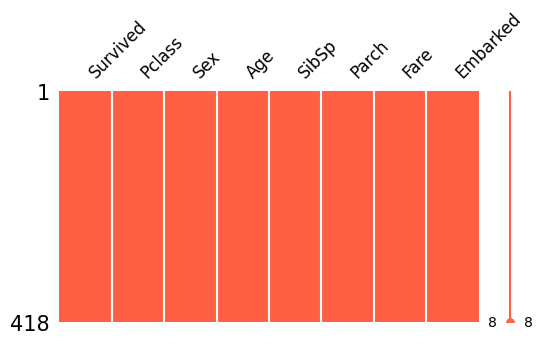

In [206]:
missingno.matrix(tsp, figsize=(6,3), fontsize=12, color=(1, 0.38, 0.27))

<Axes: >

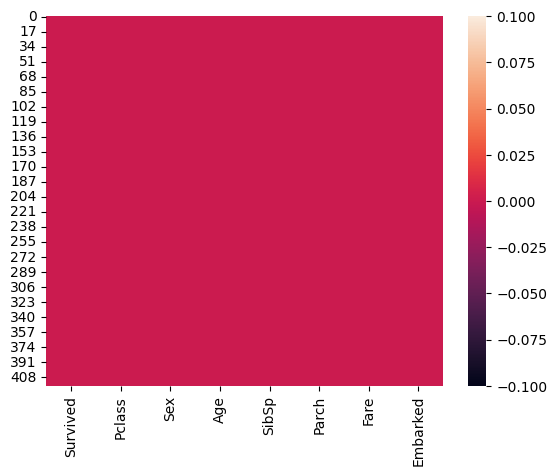

In [207]:
sns.heatmap(tsp.isnull())

In [211]:
encoder = ce.OrdinalEncoder(cols=['Survived','Pclass','Sex','Embarked'])
titanic_encoded = encoder.fit_transform(tsp)

In [426]:
titanic_encoded.head()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,1,1,1,34.5,0,0,7.8292,1
1,2,1,2,47.0,1,0,7.0000,2
2,1,2,1,62.0,0,0,9.6875,1
3,1,1,1,27.0,0,0,8.6625,2
4,2,1,2,22.0,1,1,12.2875,2


In [427]:
X = titanic_encoded.drop(['Survived'],axis=1) #Splitting training data
y = tsp['Survived']

In [536]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.22,random_state= 42)  #Splitting train and test set

# <font color="purple"><b>implementation</b></font>

## <font color="red"><b>multi layer Perceptron </b></font>

In [564]:
mlp = MLPClassifier()
mlp.fit(X_train,y_train)
y_pred_mlp_train = mlp.predict(X_train)
y_pred_mlp = mlp.predict(X_test)

In [565]:
# Classification metrics
accuracy_train = accuracy_score(y_train, y_pred_mlp_train) * 100
accuracy_test = accuracy_score(y_test, y_pred_mlp) * 100
precision = precision_score(y_test, y_pred_mlp)
recall = recall_score(y_test, y_pred_mlp)
f1 = f1_score(y_test, y_pred_mlp)
conf_matrix = confusion_matrix(y_test, y_pred_mlp)

In [566]:
print("multi layer Perceptron training Accuracy: {:.2f}%".format(accuracy_train))
print("multi layer Perceptron testing Accuracy: {:.2f}%".format(accuracy_test))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))
print("Confusion Matrix:\n", conf_matrix)

multi layer Perceptron training Accuracy: 98.77%
multi layer Perceptron testing Accuracy: 97.83%
Precision: 1.00
Recall: 0.94
F1 Score: 0.97
Confusion Matrix:
 [[58  0]
 [ 2 32]]


## <font color="red"><b>Gradient Descent</b></font>

In [540]:
sgd = SGDClassifier(max_iter=1000, tol=1e-4)
sgd.fit(X_train,y_train)
y_pred_sgd_train = sgd.predict(X_train)
y_pred_sgd = sgd.predict(X_test)

In [541]:
# Classification metrics
accuracy_train = accuracy_score(y_train, y_pred_sgd_train) * 100
accuracy_test = accuracy_score(y_test, y_pred_sgd) * 100
precision = precision_score(y_test, y_pred_sgd)
recall = recall_score(y_test, y_pred_sgd)
f1 = f1_score(y_test, y_pred_sgd)
conf_matrix = confusion_matrix(y_test, y_pred_sgd)

In [542]:
print("Gradient Descent training Accuracy: {:.2f}%".format(accuracy_train))
print("Gradient Descent testing Accuracy: {:.2f}%".format(accuracy_test))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))
print("Confusion Matrix:\n", conf_matrix)

Gradient Descent training Accuracy: 72.70%
Gradient Descent testing Accuracy: 70.65%
Precision: 1.00
Recall: 0.21
F1 Score: 0.34
Confusion Matrix:
 [[58  0]
 [27  7]]


## <font color="red"><b>Gaussian Process Classifier</b></font>

In [552]:
GPC = GaussianProcessClassifier()
GPC.fit(X_train,y_train)
y_pred_GPC_train = GPC.predict(X_train)
y_pred_GPC = GPC.predict(X_test)

In [553]:
# Classification metrics
accuracy_train = accuracy_score(y_train, y_pred_GPC_train) * 100
accuracy_test = accuracy_score(y_test, y_pred_GPC) * 100
precision = precision_score(y_test, y_pred_GPC)
recall = recall_score(y_test, y_pred_GPC)
f1 = f1_score(y_test, y_pred_GPC)
conf_matrix = confusion_matrix(y_test, y_pred_GPC)

In [554]:
print("Linear Discriminant Analysis training Accuracy: {:.2f}%".format(accuracy_train))
print("Linear Discriminant Analysis testing Accuracy: {:.2f}%".format(accuracy_test))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))
print("Confusion Matrix:\n", conf_matrix)

Linear Discriminant Analysis training Accuracy: 99.69%
Linear Discriminant Analysis testing Accuracy: 64.13%
Precision: 0.52
Recall: 0.47
F1 Score: 0.49
Confusion Matrix:
 [[43 15]
 [18 16]]


## <font color="red"><b>NuSVC</b></font>

In [570]:
from sklearn.svm import NuSVC
NuSVC = NuSVC(kernel = 'rbf', random_state = 42)
NuSVC.fit(X_train,y_train)
y_pred_NuSVC_train = NuSVC.predict(X_train)
y_pred_NuSVC = NuSVC.predict(X_test)

In [571]:
# Classification metrics
accuracy_train = accuracy_score(y_train, y_pred_NuSVC_train) * 100
accuracy_test = accuracy_score(y_test, y_pred_NuSVC) * 100
precision = precision_score(y_test, y_pred_NuSVC)
recall = recall_score(y_test, y_pred_NuSVC)
f1 = f1_score(y_test, y_pred_NuSVC)
conf_matrix = confusion_matrix(y_test, y_pred_NuSVC)

In [572]:
print("Linear Discriminant Analysis training Accuracy: {:.2f}%".format(accuracy_train))
print("Linear Discriminant Analysis testing Accuracy: {:.2f}%".format(accuracy_test))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))
print("Confusion Matrix:\n", conf_matrix)

Linear Discriminant Analysis training Accuracy: 97.85%
Linear Discriminant Analysis testing Accuracy: 98.91%
Precision: 0.97
Recall: 1.00
F1 Score: 0.99
Confusion Matrix:
 [[57  1]
 [ 0 34]]


## <font color="red"><b>Passive Aggressive Classifier</b></font>

In [585]:
from sklearn.linear_model import PassiveAggressiveClassifier
PAC = PassiveAggressiveClassifier(random_state=42)
PAC.fit(X_train,y_train)
y_pred_PAC_train = PAC.predict(X_train)
y_pred_PAC = PAC.predict(X_test)

In [586]:
# Classification metrics
accuracy_train = accuracy_score(y_train, y_pred_PAC_train) * 100
accuracy_test = accuracy_score(y_test, y_pred_PAC) * 100
precision = precision_score(y_test, y_pred_PAC)
recall = recall_score(y_test, y_pred_PAC)
f1 = f1_score(y_test, y_pred_PAC)
conf_matrix = confusion_matrix(y_test, y_pred_PAC)

In [587]:
print("Linear Discriminant Analysis training Accuracy: {:.2f}%".format(accuracy_train))
print("Linear Discriminant Analysis testing Accuracy: {:.2f}%".format(accuracy_test))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))
print("Confusion Matrix:\n", conf_matrix)

Linear Discriminant Analysis training Accuracy: 93.25%
Linear Discriminant Analysis testing Accuracy: 90.22%
Precision: 0.86
Recall: 0.88
F1 Score: 0.87
Confusion Matrix:
 [[53  5]
 [ 4 30]]


# <font color="purple"><b>Prediction & Visualize Evaluation</b></font>

In [588]:
# Evaluate multi layer Perceptron
mae_mlp_train = mean_absolute_error(y_train, y_pred_mlp_train)
mae_mlp_test = mean_absolute_error(y_test, y_pred_mlp)
mse_mlp_train = mean_squared_error(y_train, y_pred_mlp_train)
mse_mlp_test = mean_squared_error(y_test, y_pred_mlp)

# Evaluate Gradient Descent
mae_gd_train = mean_absolute_error(y_train, y_pred_sgd_train)
mae_gd_test = mean_absolute_error(y_test, y_pred_sgd)
mse_gd_train = mean_squared_error(y_train, y_pred_sgd_train)
mse_gd_test = mean_squared_error(y_test, y_pred_sgd)

# Evaluate Gaussian Process Classifier
mae_gp_train = mean_absolute_error(y_train, y_pred_GPC_train)
mae_gp_test = mean_absolute_error(y_test, y_pred_GPC)
mse_gp_train = mean_squared_error(y_train, y_pred_GPC_train)
mse_gp_test = mean_squared_error(y_test, y_pred_GPC)

# Evaluate NuSVC
mae_nu_train = mean_absolute_error(y_train, y_pred_NuSVC_train)
mae_nu_test = mean_absolute_error(y_test, y_pred_NuSVC)
mse_nu_train = mean_squared_error(y_train, y_pred_NuSVC_train)
mse_nu_test = mean_squared_error(y_test, y_pred_NuSVC)

# Evaluate Passive Aggressive Classifier
mae_pac_train = mean_absolute_error(y_train, y_pred_PAC_train)
mae_pac_test = mean_absolute_error(y_test, y_pred_PAC)
mse_pac_train = mean_squared_error(y_train, y_pred_PAC_train)
mse_pac_test = mean_squared_error(y_test, y_pred_PAC)

In [589]:
# Create DataFrames for plotting
metrics_df = pd.DataFrame({
    'Model': ['multi layer Perceptron', 'Gradient Descent', 'Gaussian Process Classifier','NuSVC','Passive Aggressive Classifier'],
    'MAE Train': [mae_mlp_train, mae_gd_train,mae_gp_train,mae_nu_train,mae_pac_train],
    'MAE Test': [mae_mlp_test, mae_gd_test, mae_gp_test,mae_nu_test,mae_pac_test],
    'MSE Train': [mse_mlp_train, mse_gd_train, mse_gp_train,mse_nu_train,mse_pac_train],
    'MSE Test': [mse_mlp_test, mse_gd_test, mse_gp_test,mse_nu_test,mse_pac_test]
})

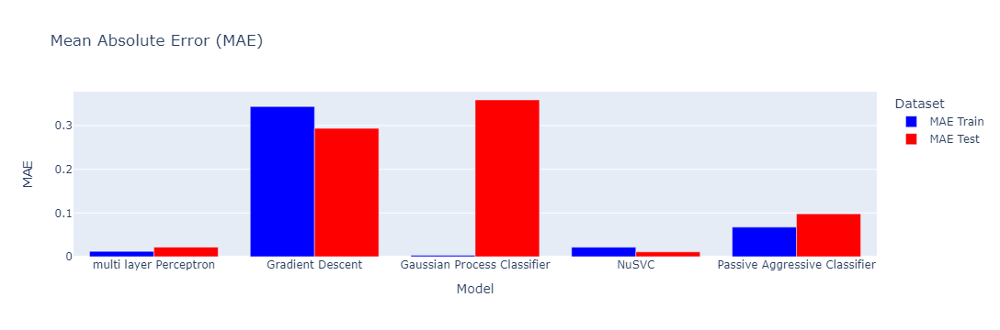

In [590]:
# Plotting MAE
fig_mae = px.bar(metrics_df, x='Model', y=['MAE Train', 'MAE Test'],
                 title='Mean Absolute Error (MAE)',
                 labels={'value': 'MAE', 'variable': 'Dataset'},
                 color_discrete_map={'MAE Train': 'blue', 'MAE Test': 'red'})
fig_mae.update_layout(barmode='group')

# Show the plots
fig_mae.show()

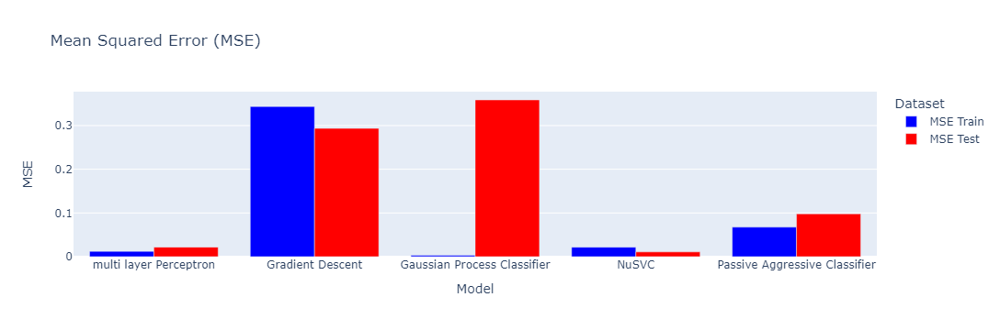

In [591]:
# Plotting MSE
fig_mse = px.bar(metrics_df, x='Model', y=['MSE Train', 'MSE Test'],
                 title='Mean Squared Error (MSE)',
                 labels={'value': 'MSE', 'variable': 'Dataset'},
                 color_discrete_map={'MSE Train': 'blue', 'MSE Test': 'red'})
fig_mse.update_layout(barmode='group')

fig_mse.show()

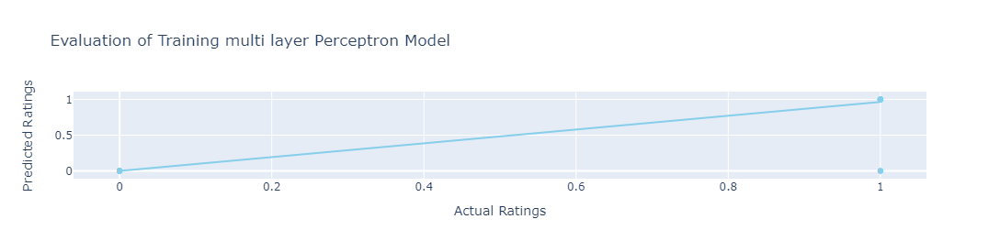

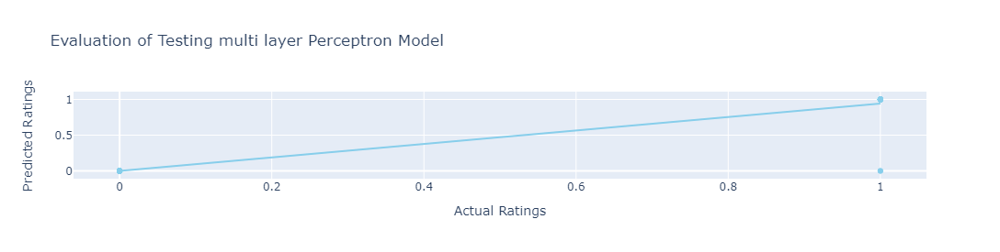

In [593]:
scatter_color = 'skyblue'
plot_width = 1000
plot_height = 275

# Scatter plot for Training Set
fig_train = px.scatter(x=y_train, y=y_pred_mlp_train, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                       title='Evaluation of Training multi layer Perceptron Model', trendline='ols',
                       color_discrete_sequence=[scatter_color])
fig_train.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Scatter plot for Testing Set
fig_test = px.scatter(x=y_test, y=y_pred_mlp, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                      title='Evaluation of Testing multi layer Perceptron Model', trendline='ols',
                      color_discrete_sequence=[scatter_color])
fig_test.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Show the plots
fig_train.show()
fig_test.show()

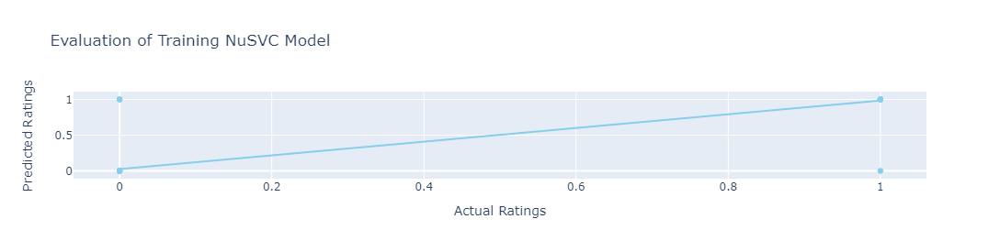

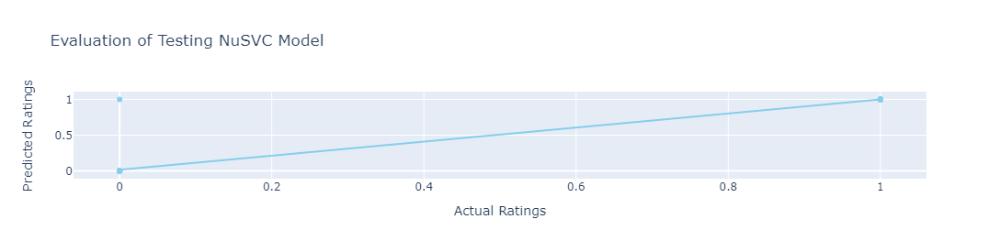

In [596]:
scatter_color = 'skyblue'
plot_width = 1000
plot_height = 275

# Scatter plot for Training Set
fig_train = px.scatter(x=y_train, y=y_pred_NuSVC_train, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                       title='Evaluation of Training NuSVC Model', trendline='ols',
                       color_discrete_sequence=[scatter_color])
fig_train.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Scatter plot for Testing Set
fig_test = px.scatter(x=y_test, y=y_pred_NuSVC, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                      title='Evaluation of Testing NuSVC Model', trendline='ols',
                      color_discrete_sequence=[scatter_color])
fig_test.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Show the plots
fig_train.show()
fig_test.show()

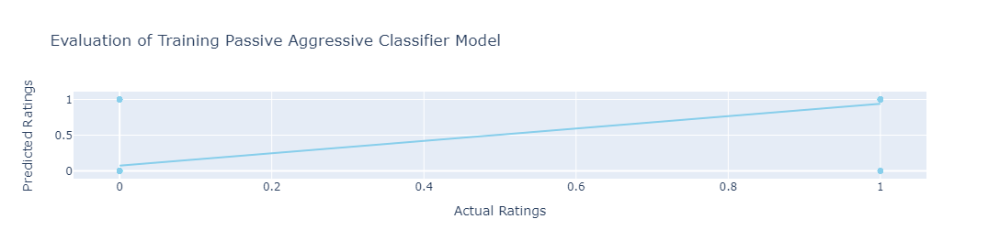

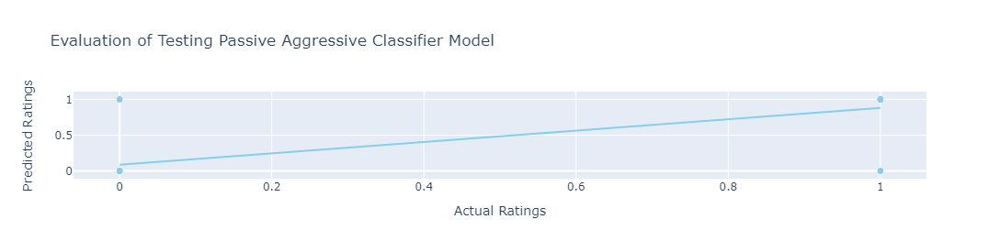

In [597]:
scatter_color = 'skyblue'
plot_width = 1000
plot_height = 275

# Scatter plot for Training Set
fig_train = px.scatter(x=y_train, y=y_pred_PAC_train, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                       title='Evaluation of Training Passive Aggressive Classifier Model', trendline='ols',
                       color_discrete_sequence=[scatter_color])
fig_train.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Scatter plot for Testing Set
fig_test = px.scatter(x=y_test, y=y_pred_PAC, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                      title='Evaluation of Testing Passive Aggressive Classifier Model', trendline='ols',
                      color_discrete_sequence=[scatter_color])
fig_test.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Show the plots
fig_train.show()
fig_test.show()

In [609]:
# Create a prediction dataframe by multi_layer_Perceptron Model
prediction_multi_layer_Perceptron = pd.DataFrame({
    'actual_rating': y_test.values.flatten(),
    'predicted_rating': y_pred_mlp.flatten(),
    'residual': (y_test.values - y_pred_mlp).flatten()
})

prediction_multi_layer_Perceptron.head()

,actual_rating,predicted_rating,residual
0,0,0,0
1,1,1,0
2,0,0,0
3,0,0,0
4,1,1,0
